## 导入模块

In [1]:
import os
import random

from PIL import Image
import matplotlib.pyplot as plt
import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torch.distributions.uniform import Uniform
from torchvision.utils import make_grid
from tensorboardX import SummaryWriter

## 数据加载类

In [2]:
class AnimeDataset(Dataset):
    def __init__(self, root_dir='/home/public/anime-faces', transform=None):
        self.root_dir = root_dir
        self.images = []
        self.get_images()
        self.transform = transform
        
    def get_images(self):
        for category in os.listdir(self.root_dir):
            if os.path.isdir(os.path.join(self.root_dir, category)):
                self.images.extend(map(lambda x: '{}/{}'.format(category, x), 
                                       os.listdir(os.path.join(self.root_dir, category))))
        
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, index):
        image_path = self.images[index]
        image = Image.open(os.path.join(self.root_dir, image_path))
        if self.transform:
            image = self.transform(image)
        return image
    
    def show_image(self, index):
        plt.imshow(self[index].permute(1, 2, 0))
        

## 可视化初始化

In [3]:
writer = SummaryWriter('./runs')

## 模型(DCGAN)
### Use ReLU activation in generator for all layers except for the output, which uses Tanh.
### Use LeakyReLU activation in the discriminator for all layers.

In [4]:
class Generator(nn.Module):
    
    def __init__(self, in_channels):
        super().__init__()
        self.gen = nn.Sequential(
            self.deconv(in_channels=in_channels, out_channels=1024, padding=0),
            self.deconv(in_channels=1024, out_channels=512, stride=2),
            self.deconv(in_channels=512, out_channels=256, stride=2),
            self.deconv(in_channels=256, out_channels=128, stride=2),
            nn.ConvTranspose2d(in_channels=128, out_channels=3, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )
        
        self.init_weight()
        
    def forward(self, x):
        return self.gen(x)
        
    def deconv(self, in_channels, out_channels, kernel_size=4, stride=1, padding=1):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride, padding=padding),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True)
        )
                
    def init_weight(self, w_mean=0., w_std=0.02, b_mean=1, b_std=0.02):
        for m in self.modules():
            if isinstance(m, nn.ConvTranspose2d):
                nn.init.normal_(m.weight, mean=w_mean, std=w_std)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.normal_(m.weight, mean=b_mean, std=b_std)
                nn.init.constant_(m.bias, 0)
        
    
    
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.dis = nn.Sequential(
            self.conv(in_channels=3, out_channels=128, stride=2),
            self.conv(in_channels=128, out_channels=256, stride=2),
            self.conv(in_channels=256, out_channels=512, stride=2),
            self.conv(in_channels=512, out_channels=1024, stride=2),
            nn.Conv2d(in_channels=1024, out_channels=1, kernel_size=4, stride=1, padding=0),
            nn.Sigmoid()
            
        )
    
        self.init_weight()
        
    def forward(self, x):
        x = self.dis(x)
        return x
    
    def conv(self, in_channels, out_channels, kernel_size=4, stride=1, padding=1):
        return nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride, padding=padding),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True)
        )
    
    def init_weight(self, w_mean=0., w_std=0.02, b_mean=1, b_std=0.02):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.normal_(m.weight, mean=w_mean, std=w_std)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.normal_(m.weight, mean=b_mean, std=b_std)
                nn.init.constant_(m.bias, 0)
            
gen = Generator(in_channels=100)
dis = Discriminator()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# gen.to(device)
# dis.to(device)

# writer.add_graph(gen, input_to_model=torch.randn([1, 100, 1, 1]))

## 参数设置

In [5]:
ngpu = 2
IS_PARALLEL = True if ngpu > 1 else False
nz = 100
num_epochs = 100000
batch_size = 64
fixed_noise = torch.randn(16, nz, 1, 1, device=device)

real_label = 1
fake_label = 0

if IS_PARALLEL and torch.cuda.device_count() > 1:
    gen = nn.DataParallel(gen, device_ids=range(ngpu)).to(device)
    dis = nn.DataParallel(dis, device_ids=range(ngpu)).to(device)
    
criterion = nn.BCELoss()

beta1 = 0.5
gen_optimizer = torch.optim.Adam(gen.parameters(), lr=0.0002, betas=(beta1, 0.999))
dis_optimizer = torch.optim.Adam(dis.parameters(), lr=0.0002, betas=(beta1, 0.999))

lr_scheduler_g = torch.optim.lr_scheduler.StepLR(gen_optimizer, step_size=3, gamma=0.1)
lr_scheduler_d = torch.optim.lr_scheduler.StepLR(dis_optimizer, step_size=3, gamma=0.1)  # 每set_size个epoch更新一次学习率

## 数据处理

In [6]:
t = transforms.Compose(
    [
        transforms.Resize(64),
#         transforms.CenterCrop(64),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ]
)

dataset = AnimeDataset(root_dir='/data/LHao/dataset/', transform=t)
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, drop_last=True)
train_loader = iter(train_loader)

## 训练

[999/100000]	Loss_D: 0.8293	Loss_G: 9.2623:   1%|          | 999/100000 [02:45<4:22:17,  6.29it/s]  

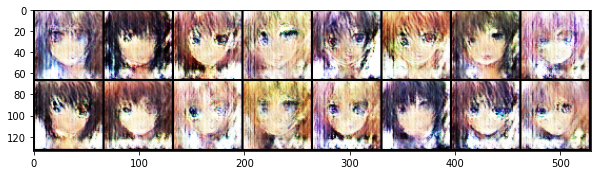

[1999/100000]	Loss_D: 0.4865	Loss_G: 4.5816:   2%|▏         | 1999/100000 [05:25<4:19:52,  6.29it/s] 

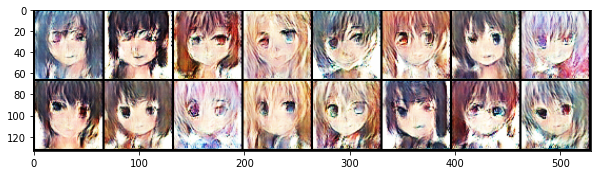

[2999/100000]	Loss_D: 0.5013	Loss_G: 7.8627:   3%|▎         | 2999/100000 [08:04<4:16:52,  6.29it/s] 

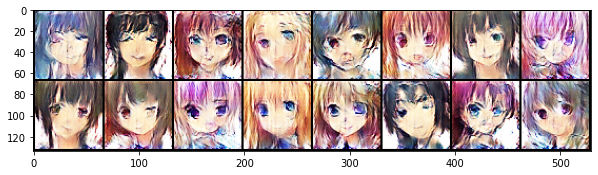

[3999/100000]	Loss_D: 0.3592	Loss_G: 3.0101:   4%|▍         | 3999/100000 [10:45<4:15:13,  6.27it/s] 

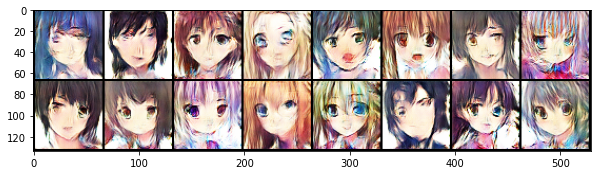

[4999/100000]	Loss_D: 0.1848	Loss_G: 4.7015:   5%|▍         | 4999/100000 [13:25<4:13:06,  6.26it/s] 

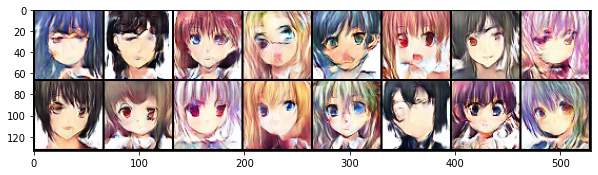

[5999/100000]	Loss_D: 0.3511	Loss_G: 7.3052:   6%|▌         | 5999/100000 [16:05<4:09:55,  6.27it/s] 

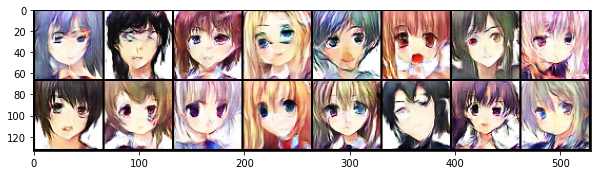

[6999/100000]	Loss_D: 0.1493	Loss_G: 3.2903:   7%|▋         | 6999/100000 [18:45<4:11:56,  6.15it/s] 

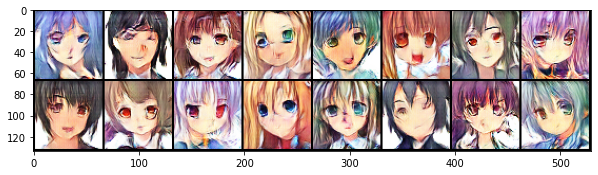

[7999/100000]	Loss_D: 6.6151	Loss_G: 0.0790:   8%|▊         | 7999/100000 [21:26<4:04:32,  6.27it/s] 

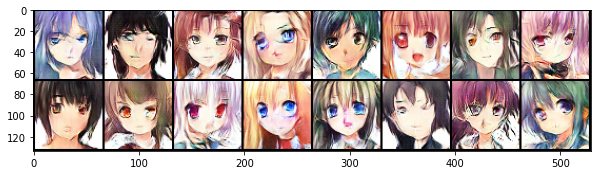

[8999/100000]	Loss_D: 0.3379	Loss_G: 7.6288:   9%|▉         | 8999/100000 [24:06<4:01:36,  6.28it/s] 

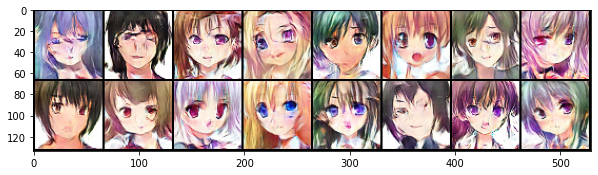

[9999/100000]	Loss_D: 0.2186	Loss_G: 5.3784:  10%|▉         | 9999/100000 [26:45<3:58:39,  6.29it/s] 

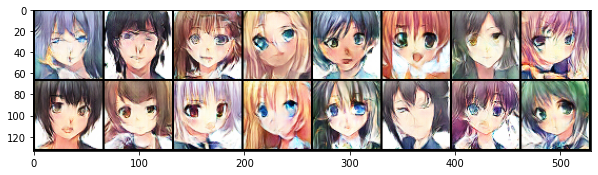

[10999/100000]	Loss_D: 0.0788	Loss_G: 4.6334:  11%|█         | 10999/100000 [29:25<3:56:01,  6.28it/s] 

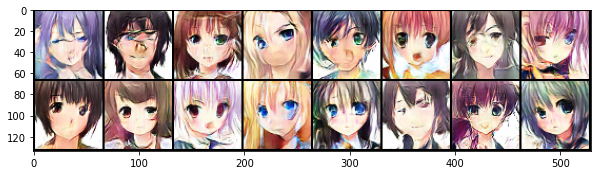

[11999/100000]	Loss_D: 0.2015	Loss_G: 8.5230:  12%|█▏        | 11999/100000 [32:04<3:53:28,  6.28it/s]  

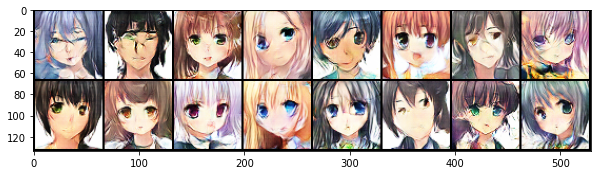

[12999/100000]	Loss_D: 0.4261	Loss_G: 4.7342:  13%|█▎        | 12999/100000 [34:44<3:50:29,  6.29it/s] 

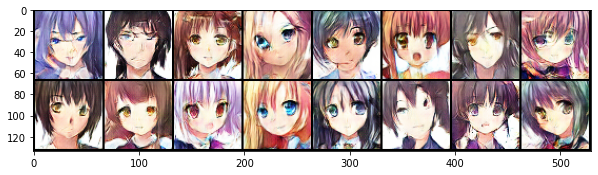

[13999/100000]	Loss_D: 0.4501	Loss_G: 2.6322:  14%|█▍        | 13999/100000 [37:23<3:46:29,  6.33it/s] 

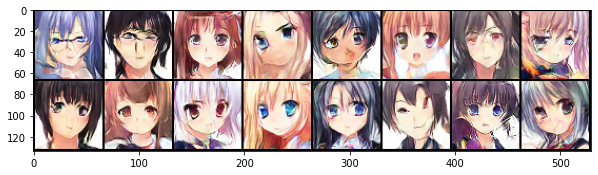

[14999/100000]	Loss_D: 0.0614	Loss_G: 4.3732:  15%|█▍        | 14999/100000 [40:03<3:49:38,  6.17it/s] 

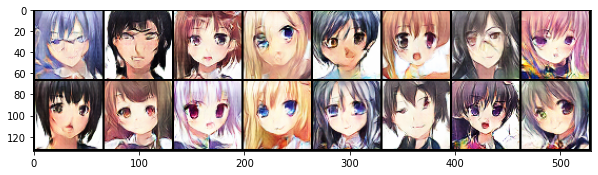

[15999/100000]	Loss_D: 0.0186	Loss_G: 5.0816:  16%|█▌        | 15999/100000 [42:42<3:44:04,  6.25it/s]

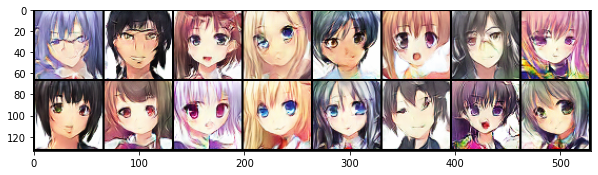

[16999/100000]	Loss_D: 0.0374	Loss_G: 5.2731:  17%|█▋        | 16999/100000 [45:22<3:40:45,  6.27it/s]

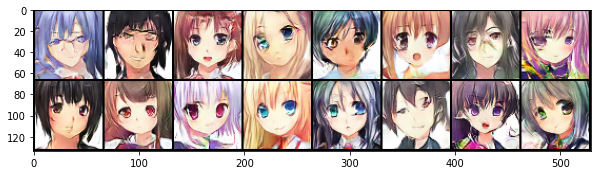

[17999/100000]	Loss_D: 0.0100	Loss_G: 6.6167:  18%|█▊        | 17999/100000 [48:02<3:37:45,  6.28it/s]

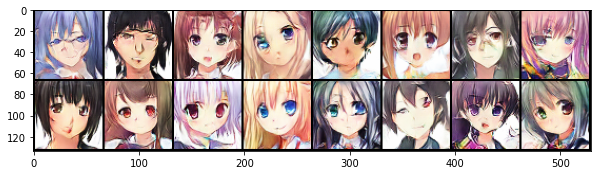

[18999/100000]	Loss_D: 0.0223	Loss_G: 6.3862:  19%|█▉        | 18999/100000 [50:42<3:35:14,  6.27it/s]

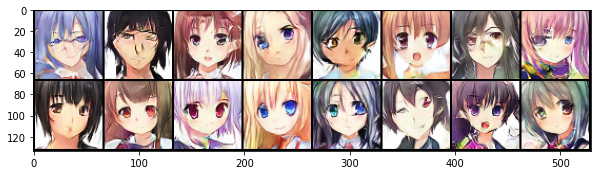

[19999/100000]	Loss_D: 0.0061	Loss_G: 7.2782:  20%|█▉        | 19999/100000 [53:22<3:32:00,  6.29it/s]

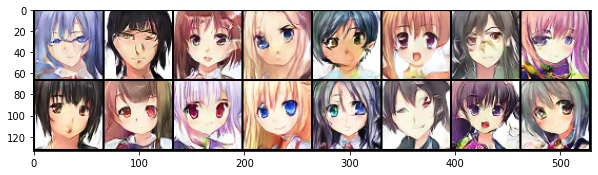

[20999/100000]	Loss_D: 0.0096	Loss_G: 6.6566:  21%|██        | 20999/100000 [56:04<3:34:15,  6.15it/s]

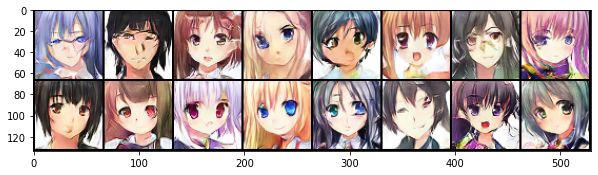

[21999/100000]	Loss_D: 0.0095	Loss_G: 6.8079:  22%|██▏       | 21999/100000 [58:43<3:27:02,  6.28it/s] 

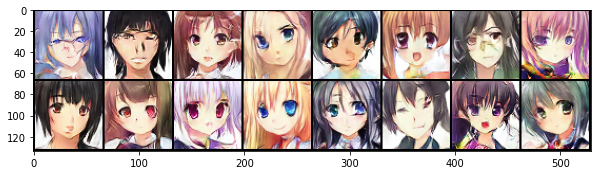

[22999/100000]	Loss_D: 0.0190	Loss_G: 6.6285:  23%|██▎       | 22999/100000 [1:01:23<3:24:09,  6.29it/s]

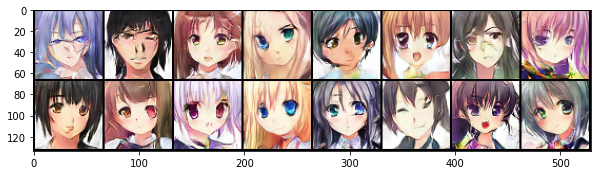

[23999/100000]	Loss_D: 0.0130	Loss_G: 6.5833:  24%|██▍       | 23999/100000 [1:04:02<3:22:49,  6.25it/s]

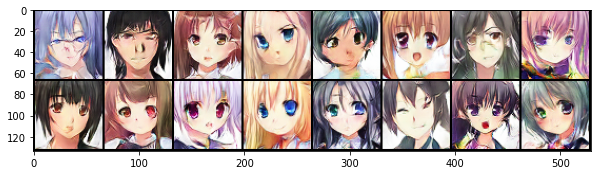

[24999/100000]	Loss_D: 0.0036	Loss_G: 7.7778:  25%|██▍       | 24999/100000 [1:06:43<3:19:56,  6.25it/s]

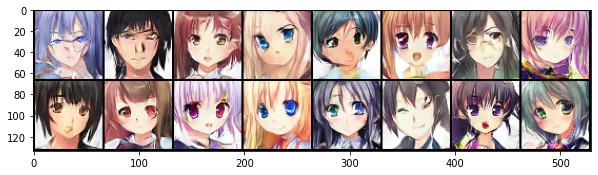

[25999/100000]	Loss_D: 0.0051	Loss_G: 7.3191:  26%|██▌       | 25999/100000 [1:09:22<3:16:28,  6.28it/s] 

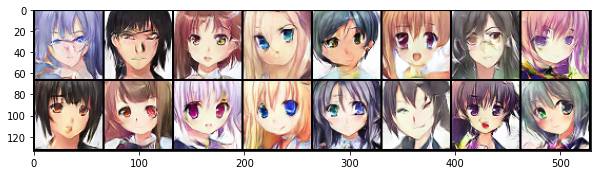

[26999/100000]	Loss_D: 0.0056	Loss_G: 7.5848:  27%|██▋       | 26999/100000 [1:12:02<3:15:50,  6.21it/s] 

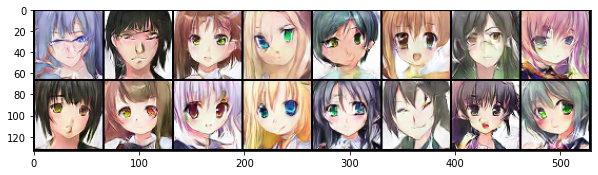

[27999/100000]	Loss_D: 0.0040	Loss_G: 8.0901:  28%|██▊       | 27999/100000 [1:14:43<3:11:39,  6.26it/s]

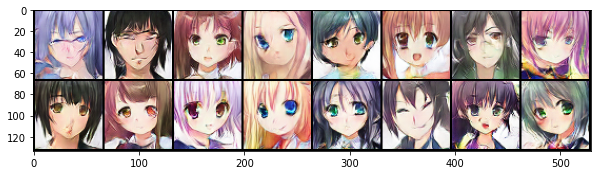

[28999/100000]	Loss_D: 0.0079	Loss_G: 8.6521:  29%|██▉       | 28999/100000 [1:17:22<3:09:03,  6.26it/s] 

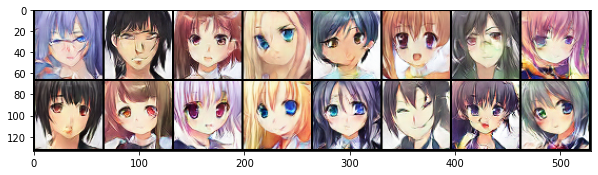

[29999/100000]	Loss_D: 0.0128	Loss_G: 6.8299:  30%|██▉       | 29999/100000 [1:20:02<3:06:10,  6.27it/s] 

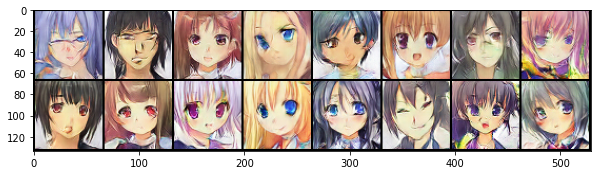

[30999/100000]	Loss_D: 0.0082	Loss_G: 7.6304:  31%|███       | 30999/100000 [1:22:42<3:03:07,  6.28it/s]

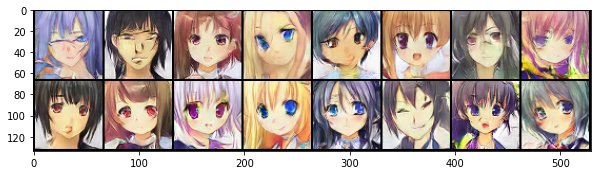

[31999/100000]	Loss_D: 0.0060	Loss_G: 8.0455:  32%|███▏      | 31999/100000 [1:25:22<3:00:43,  6.27it/s]

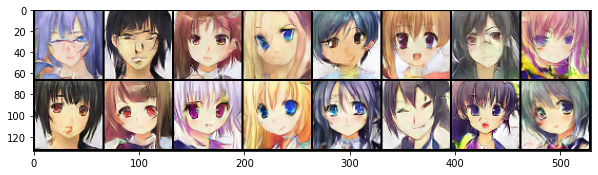

[32999/100000]	Loss_D: 0.0029	Loss_G: 7.5613:  33%|███▎      | 32999/100000 [1:28:02<2:58:26,  6.26it/s]

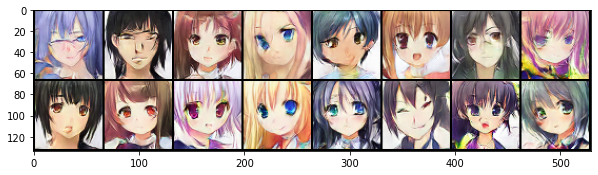

[33999/100000]	Loss_D: 0.0038	Loss_G: 8.3797:  34%|███▍      | 33999/100000 [1:30:42<2:56:31,  6.23it/s]

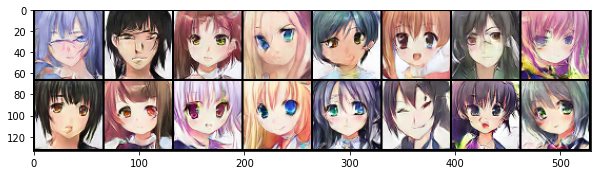

[34999/100000]	Loss_D: 0.0052	Loss_G: 7.7682:  35%|███▍      | 34999/100000 [1:33:21<2:52:47,  6.27it/s]

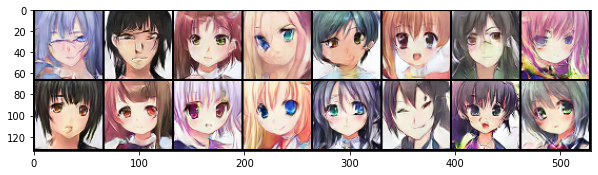

[35999/100000]	Loss_D: 0.0033	Loss_G: 8.1081:  36%|███▌      | 35999/100000 [1:36:01<2:49:21,  6.30it/s]

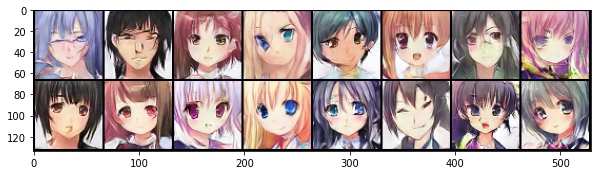

[36999/100000]	Loss_D: 0.0070	Loss_G: 8.2191:  37%|███▋      | 36999/100000 [1:38:41<2:47:17,  6.28it/s]

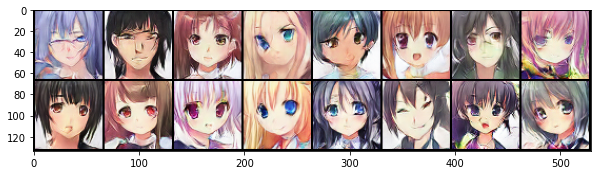

[37999/100000]	Loss_D: 0.0029	Loss_G: 7.9424:  38%|███▊      | 37999/100000 [1:41:20<2:45:04,  6.26it/s]

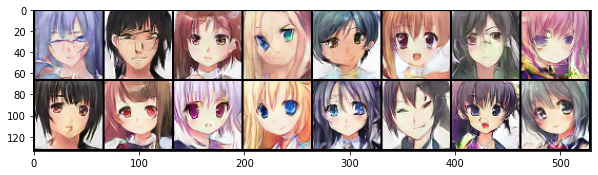

[38999/100000]	Loss_D: 0.0034	Loss_G: 9.0041:  39%|███▉      | 38999/100000 [1:44:00<2:41:40,  6.29it/s]

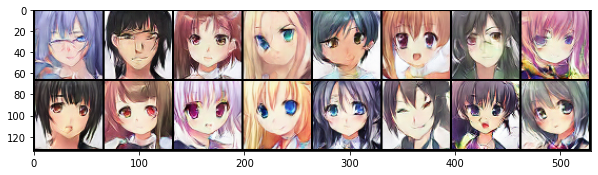

[39999/100000]	Loss_D: 0.0065	Loss_G: 7.1907:  40%|███▉      | 39999/100000 [1:46:39<2:39:07,  6.28it/s]

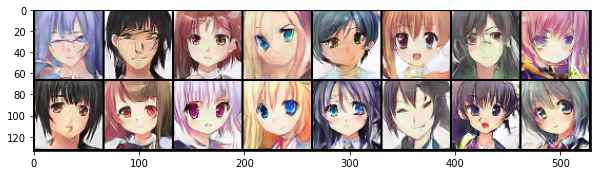

[40999/100000]	Loss_D: 0.0017	Loss_G: 8.4466:  41%|████      | 40999/100000 [1:49:20<2:37:32,  6.24it/s]

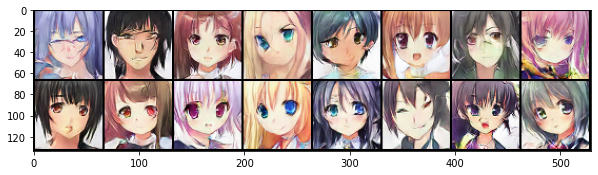

[41999/100000]	Loss_D: 0.0018	Loss_G: 9.1373:  42%|████▏     | 41999/100000 [1:52:00<2:34:01,  6.28it/s] 

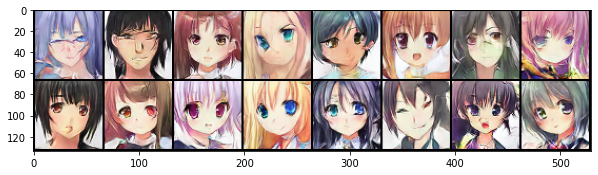

[42999/100000]	Loss_D: 0.0021	Loss_G: 8.3968:  43%|████▎     | 42999/100000 [1:54:40<2:31:24,  6.27it/s]

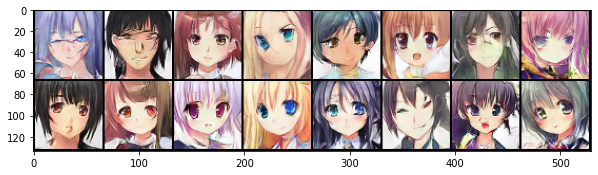

[43999/100000]	Loss_D: 0.0015	Loss_G: 8.5821:  44%|████▍     | 43999/100000 [1:57:20<2:29:19,  6.25it/s]

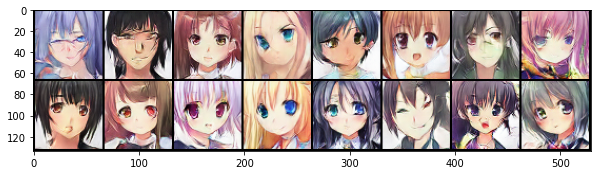

[44999/100000]	Loss_D: 0.0017	Loss_G: 8.5766:  45%|████▍     | 44999/100000 [1:59:59<2:26:19,  6.26it/s] 

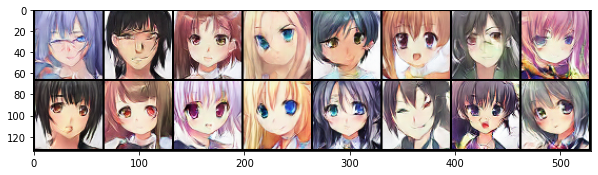

[45999/100000]	Loss_D: 0.0011	Loss_G: 8.8819:  46%|████▌     | 45999/100000 [2:02:40<2:26:19,  6.15it/s] 

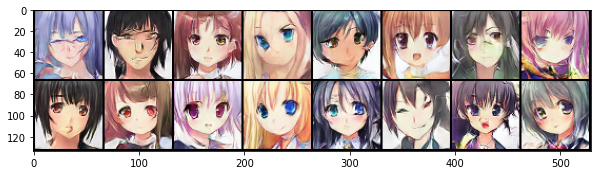

[46999/100000]	Loss_D: 0.0012	Loss_G: 9.2317:  47%|████▋     | 46999/100000 [2:05:21<2:21:46,  6.23it/s]

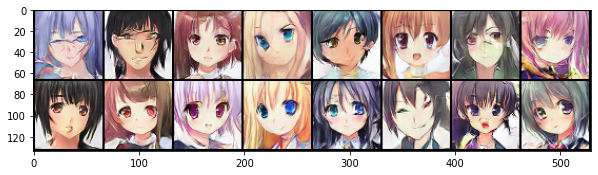

[47999/100000]	Loss_D: 0.0023	Loss_G: 8.1812:  48%|████▊     | 47999/100000 [2:08:02<2:21:00,  6.15it/s] 

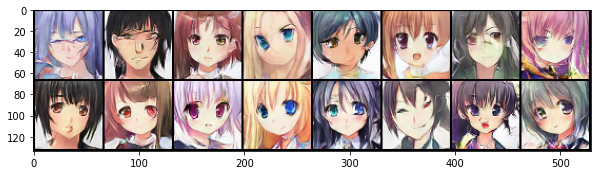

[48999/100000]	Loss_D: 0.0020	Loss_G: 8.2820:  49%|████▉     | 48999/100000 [2:10:42<2:15:26,  6.28it/s] 

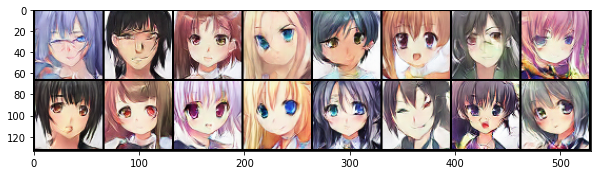

[49999/100000]	Loss_D: 0.0031	Loss_G: 8.4749:  50%|████▉     | 49999/100000 [2:13:22<2:12:44,  6.28it/s] 

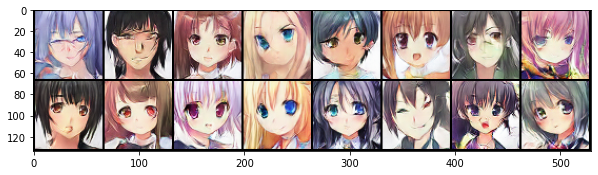

[50999/100000]	Loss_D: 0.0025	Loss_G: 8.1680:  51%|█████     | 50999/100000 [2:16:02<2:10:12,  6.27it/s] 

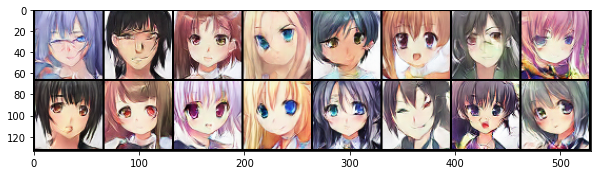

[51999/100000]	Loss_D: 0.0042	Loss_G: 8.3514:  52%|█████▏    | 51999/100000 [2:18:42<2:07:24,  6.28it/s] 

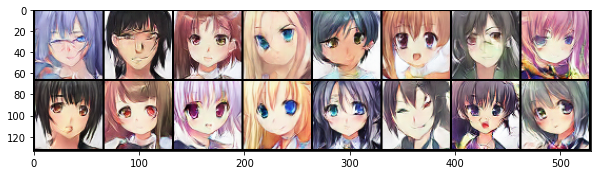

[52999/100000]	Loss_D: 0.0016	Loss_G: 8.4653:  53%|█████▎    | 52999/100000 [2:21:22<2:04:52,  6.27it/s] 

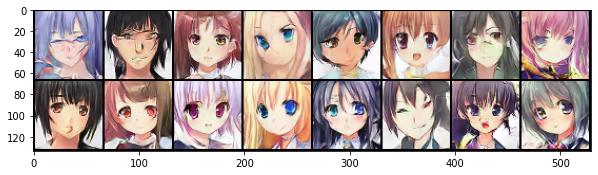

[53999/100000]	Loss_D: 0.0014	Loss_G: 8.7154:  54%|█████▍    | 53999/100000 [2:24:02<2:02:43,  6.25it/s] 

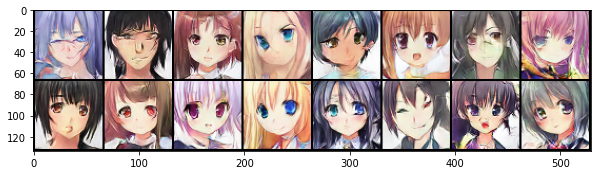

[54999/100000]	Loss_D: 0.0010	Loss_G: 8.7892:  55%|█████▍    | 54999/100000 [2:26:42<1:59:35,  6.27it/s] 

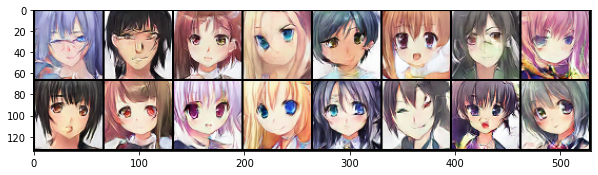

[55999/100000]	Loss_D: 0.0026	Loss_G: 8.5011:  56%|█████▌    | 55999/100000 [2:29:22<1:57:12,  6.26it/s] 

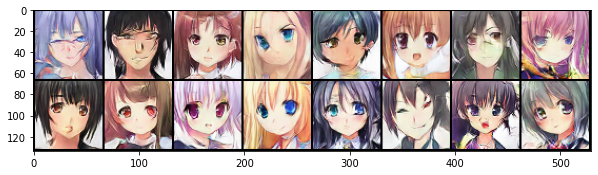

[56999/100000]	Loss_D: 0.0009	Loss_G: 9.4697:  57%|█████▋    | 56999/100000 [2:32:03<1:54:48,  6.24it/s] 

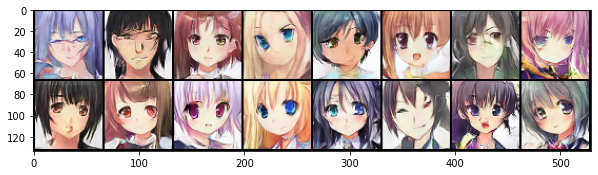

[57999/100000]	Loss_D: 0.0037	Loss_G: 8.1401:  58%|█████▊    | 57999/100000 [2:34:43<1:52:03,  6.25it/s] 

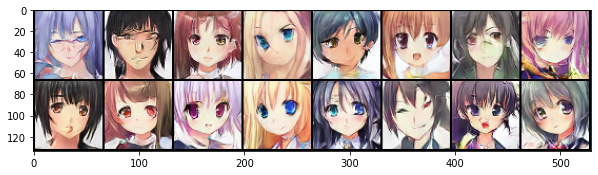

[58999/100000]	Loss_D: 0.0012	Loss_G: 8.6914:  59%|█████▉    | 58999/100000 [2:37:23<1:49:20,  6.25it/s] 

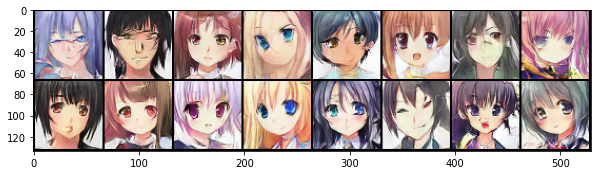

[59999/100000]	Loss_D: 0.0026	Loss_G: 9.2468:  60%|█████▉    | 59999/100000 [2:40:03<1:46:17,  6.27it/s] 

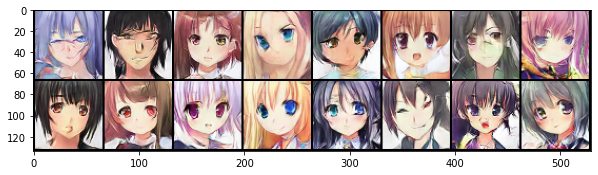

[60999/100000]	Loss_D: 0.0013	Loss_G: 8.6924:  61%|██████    | 60999/100000 [2:42:43<1:43:30,  6.28it/s] 

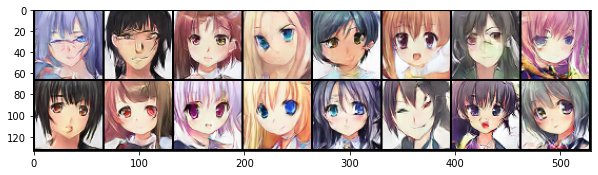

[61999/100000]	Loss_D: 0.0026	Loss_G: 8.6027:  62%|██████▏   | 61999/100000 [2:45:22<1:40:42,  6.29it/s] 

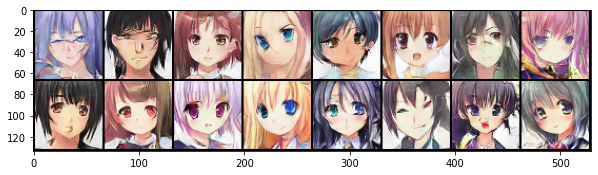

[62999/100000]	Loss_D: 0.0007	Loss_G: 9.4049:  63%|██████▎   | 62999/100000 [2:48:03<1:38:52,  6.24it/s] 

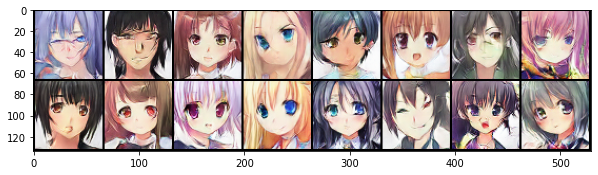

[63999/100000]	Loss_D: 0.0020	Loss_G: 8.6368:  64%|██████▍   | 63999/100000 [2:50:43<1:36:02,  6.25it/s] 

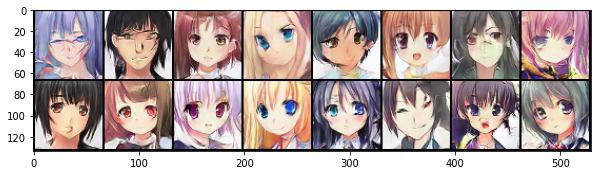

[64999/100000]	Loss_D: 0.0033	Loss_G: 8.4391:  65%|██████▍   | 64999/100000 [2:53:23<1:33:08,  6.26it/s] 

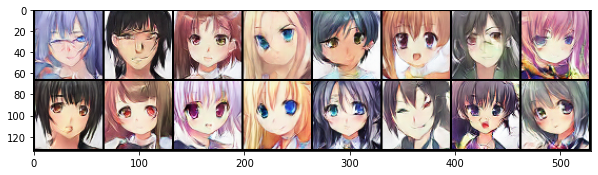

[65999/100000]	Loss_D: 0.0016	Loss_G: 8.7235:  66%|██████▌   | 65999/100000 [2:56:04<1:30:40,  6.25it/s]

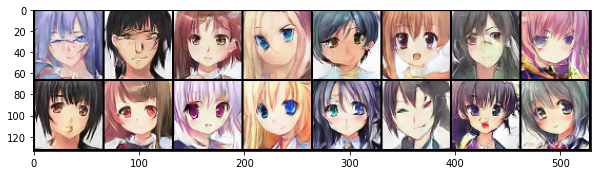

[66999/100000]	Loss_D: 0.0011	Loss_G: 8.8842:  67%|██████▋   | 66999/100000 [2:58:44<1:27:41,  6.27it/s] 

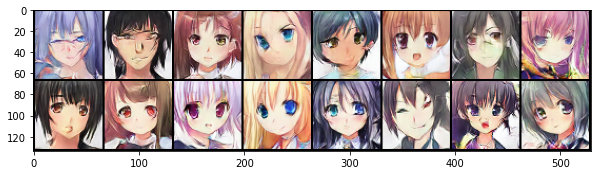

[67999/100000]	Loss_D: 0.0046	Loss_G: 7.9619:  68%|██████▊   | 67999/100000 [3:01:25<1:25:16,  6.25it/s]

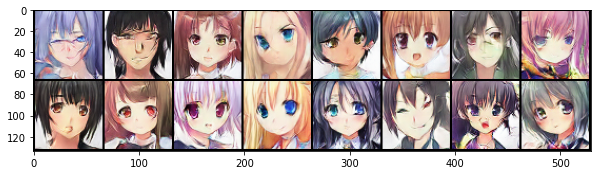

[68999/100000]	Loss_D: 0.0025	Loss_G: 8.5338:  69%|██████▉   | 68999/100000 [3:04:04<1:22:19,  6.28it/s] 

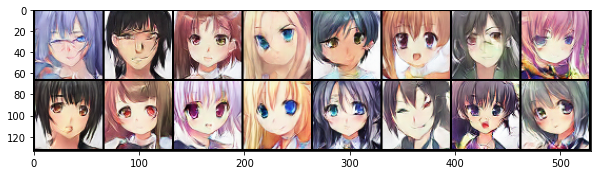

[69999/100000]	Loss_D: 0.0019	Loss_G: 9.0641:  70%|██████▉   | 69999/100000 [3:06:43<1:19:33,  6.29it/s] 

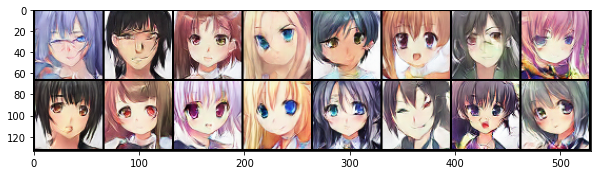

[70999/100000]	Loss_D: 0.0031	Loss_G: 8.7651:  71%|███████   | 70999/100000 [3:09:24<1:17:06,  6.27it/s] 

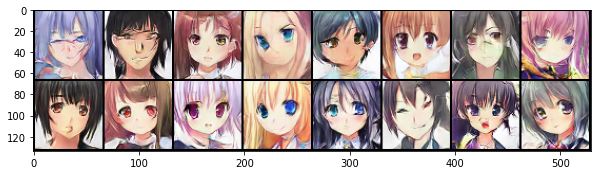

[71999/100000]	Loss_D: 0.0019	Loss_G: 8.5966:  72%|███████▏  | 71999/100000 [3:12:04<1:14:25,  6.27it/s]

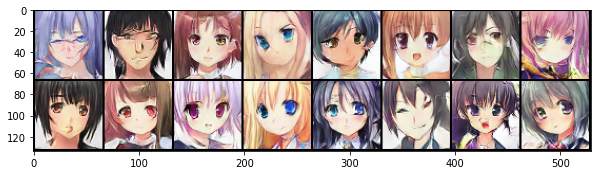

[72837/100000]	Loss_D: 0.0026	Loss_G: 8.9415:  73%|███████▎  | 72837/100000 [3:14:19<1:12:13,  6.27it/s] 

In [ ]:
def requires_grad(model, flag=True):
    for p in model.parameters():
        p.requires_grad = flag

d_loss = torch.tensor(0)
g_loss = torch.tensor(0)

pbar = tqdm.tqdm(range(num_epochs))

for epoch in pbar:
    try:
        data = next(train_loader)
    except StopIteration:
        train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, drop_last=True)
        train_loader = iter(train_loader)
        data = next(train_loader)
            

    ############################
    # (1)  maximize log(D(x)) + log(1 - D(G(z)))
    ###########################
    requires_grad(gen, False)
    requires_grad(dis, True)
    dis.zero_grad()
    real_images = data.to(device)
    b_size = real_images.size(0)
    label = torch.full((b_size,), real_label, device=device, dtype=torch.float32)
    output = dis(real_images).view(-1)
    errD_real = criterion(output, label)
    errD_real.backward()
    d_loss = output.mean().item()

    noise = torch.randn(b_size, nz, 1, 1, device=device)
    fake = gen(noise)
    label.fill_(fake_label)
    output = dis(fake.detach()).view(-1)
    errD_fake = criterion(output, label)
    errD_fake.backward()
    D_G_z1 = output.mean().item()
    d_loss = errD_real + errD_fake
    dis_optimizer.step()

    ############################
    # (2) maximize log(D(G(z)))
    ###########################
    requires_grad(gen, True)
    requires_grad(dis, False)
    gen.zero_grad()
    label.fill_(real_label)  
    output = dis(fake).view(-1)
    g_loss = criterion(output, label)
    g_loss.backward()
    D_G_z2 = output.mean().item()
    gen_optimizer.step()

    # loss可视化
    writer.add_scalar('d_loss', d_loss, epoch)
    writer.add_scalar('g_loss', g_loss, epoch)

    state_msg = (
        '[%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f'% (epoch, num_epochs, d_loss.item(), g_loss.item())
    )
    pbar.set_description(state_msg)
    
    if (epoch+1) % 5000 == 0:
        # 每过5000个epoch更新一次lr
        lr_scheduler_d.step()
        lr_scheduler_g.step()
    
    # 显示生成图像质量
    if (epoch+1) % 1000 == 0:
        with torch.no_grad():
            fake = gen(fixed_noise).detach().cpu()
        img_grid = make_grid(fake, padding=2, normalize=True)
        plt.figure(figsize=(10,10))
        plt.imshow(img_grid.permute(1, 2, 0))
        plt.show()
    
    # 保存模型
    if (epoch+1) % 10000 == 0:
        checkpoint = {
            "g_model_state_dict": gen.module.state_dict(),
            "d_model_state_dict": dis.module.state_dict(),
        }
        path_checkpoint = os.path.join('./checkpoints', "checkpoint_{}_epoch.pkl".format(epoch))
        torch.save(checkpoint, path_checkpoint)